<a href="https://colab.research.google.com/github/renaud-florquin/hands_on_AI/blob/master/Intro1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Google colab

## Load a file using google.colab or using wget

In [0]:
import google.colab as colab
import IPython.display

In [9]:
colab.files.upload()

Saving umons.jpg to umons.jpg


{'umons.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xdb\x00C\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xc2\x00\x11\x08\x016\x02l\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1e\x00\x00\x00\x06\x03\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x05\x06\x07\x08\x01\x02\x03\t\n\xff\xc4\x00\x1c\x01\x00\x01\x05\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x02\x04\x05\x06\x01\x07\x08\xff\xda\x00\x0c\x03\x01\x00\x02\x10\x03\x10\x00\x00\x01\xf

In [7]:
!wget -O mons.jpg https://upload.wikimedia.org/wikipedia/commons/a/ad/0_Mons_-_H%C3%B4tel_de_ville_%281%29.jpg

--2019-10-05 09:32:45--  https://upload.wikimedia.org/wikipedia/commons/a/ad/0_Mons_-_H%C3%B4tel_de_ville_%281%29.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3632244 (3.5M) [image/jpeg]
Saving to: ‘mons.jpg’

mons.jpg            100%[===================>]   3.46M  6.93MB/s    in 0.5s    

2019-10-05 09:32:46 (6.93 MB/s) - ‘mons.jpg’ saved [3632244/3632244]



In [10]:
!ls *.jpg

mons.jpg  umons.jpg


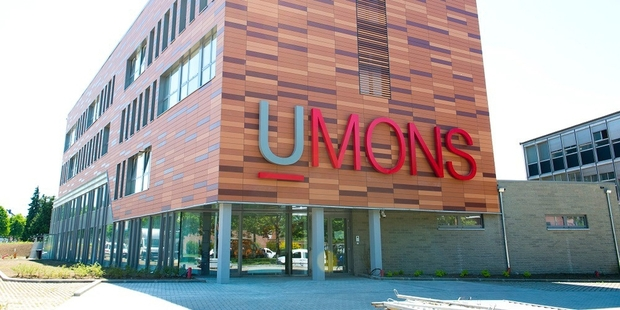

In [12]:
IPython.display.Image(filename='umons.jpg') 

# OpenCV

In [0]:
import cv2
import os
import numpy as np
import glob
import imageio
from matplotlib import pyplot as plt

In [0]:
print(cv2.__version__)

3.4.3


## Load, save and display an image using OpenCV

Load an image using openCV: the order of color channels are BGR, so we have to change the order before to display the image using pyplot.

In [0]:
img_bgr = cv2.imread('umons.jpg', 3)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

In [0]:
# or explictly
b,g,r=cv2.split(img_bgr)
img_rgb = cv2.merge([r,g,b])

In [23]:
print(type(img_rgb))
print(img_rgb.shape)

<class 'numpy.ndarray'>
(310, 620, 3)


Display the image using matplotlib

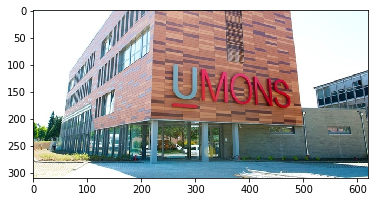

In [25]:
plt.imshow(img_rgb)

### Convert color image to BW


In [0]:
img_bw = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

In [29]:
img_bw.shape

(310, 620)

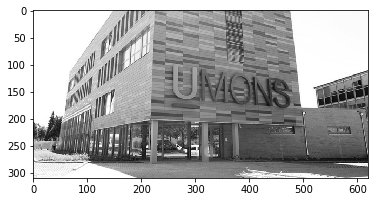

In [30]:
plt.imshow(img_bw, cmap='gray')

### Save the BW image to file system

In [32]:
cv2.imwrite('umons_bw.png', img_bw)

True

In [33]:
ls -l *.png

-rw-r--r-- 1 root root 115286 Oct  5 10:09 umons_bw.png


Display the saved image

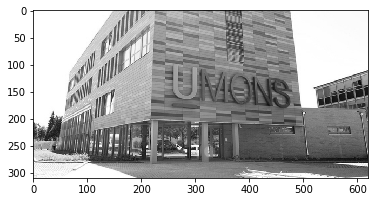

In [38]:
umons_bw = cv2.imread('umons_bw.png', 3)
plt.imshow(umons_bw)

In [39]:
umons_bw.shape

(310, 620, 3)

## Image processing using OpenCV

##**2.7.1- Gaussian Blurring**

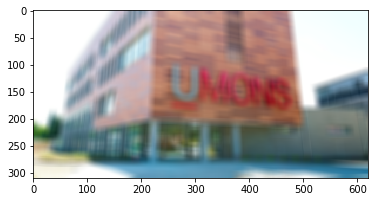

In [0]:
blur = cv2.blur(rgb_image,(15,15)) # (15,15) est le kernal
plt.imshow(blur)

# * Question 3: Modifier la taille du kernel et testez de nouveau et afficher le résultat après chaque application de filtre ? *

## **2.7.2- Median Blurring**

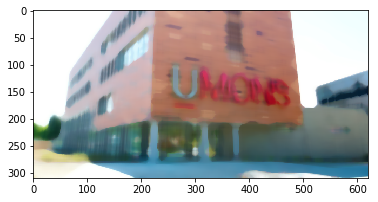

In [0]:
median = cv2.medianBlur(rgb_image,15)
plt.imshow(median)

## **2.7.3- Bilateral Blurring**

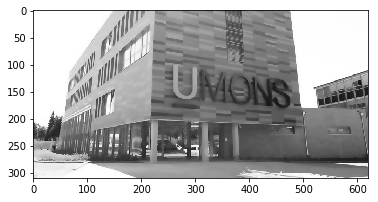

In [0]:
bilateral=cv2.bilateralFilter(img,9,75,75)
plt.imshow(bilateral)

#**2.8- Détection des contours (Canny)**

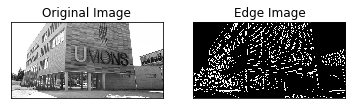

In [0]:
edges = cv2.Canny(gray,100,200)
plt.subplot(121),plt.imshow(gray,cmap = 'gray')    # 121 : ligne 1, 2 : 2 images, 1 : première colonne
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')   # 122 : ligne 1, 2 : 2 images, 2 : deuxième colonne
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()

#**2.9- Détection des points d'intérêts (Harris)**

### ** 2.9.1 Récupérer une nouvelle image depuis le web **

### ** 2.9.2 Détecter les coins **

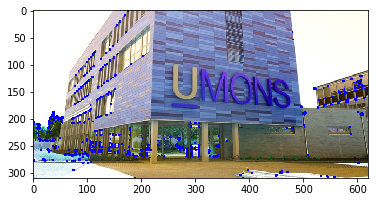

In [0]:
img = cv2.imread("umons.jpg")
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
dst = cv2.cornerHarris(gray,2,3,0.04)
dst = cv2.dilate(dst,None)
# Threshold for an optimal value, it may vary depending on the image.
img[dst>0.02*dst.max()]=[0,0,255]
plt.imshow(img)


# Exercice 01

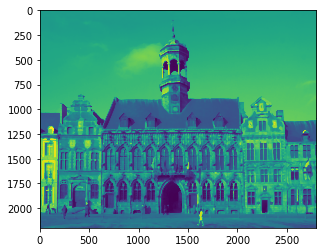

In [0]:
def filter_img(img):
      img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
      img = cv2.medianBlur(img,15)
      #img = cv2.Canny(img,50,50)
      return img

plt.imshow(filter_img(cv2.imread("mons.jpg")))

#**3.1- Affichage de la vidéo charger**

In [0]:
files.upload()

Saving video.mp4 to video.mp4


{'video.mp4': b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00 \x90Wmdat\x00\x00\x02\x9c\x06\x05\xff\xff\x98\xdcE\xe9\xbd\xe6\xd9H\xb7\x96,\xd8 \xd9#\xee\xefx264 - core 157 - H.264/MPEG-4 AVC codec - Copyleft 2003-2019 - http://www.videolan.org/x264.html - options: cabac=1 ref=1 deblock=1:0:0 analyse=0x3:0x3 me=dia subme=1 psy=1 psy_rd=1.00:0.00 mixed_ref=0 me_range=16 chroma_me=1 trellis=0 8x8dct=1 cqm=0 deadzone=21,11 fast_pskip=1 chroma_qp_offset=0 threads=15 lookahead_threads=2 sliced_threads=0 nr=0 decimate=1 interlaced=0 bluray_compat=0 constrained_intra=0 bframes=3 b_pyramid=2 b_adapt=1 b_bias=0 direct=1 weightb=1 open_gop=0 weightp=1 keyint=250 keyint_min=25 scenecut=40 intra_refresh=0 rc=crf mbtree=0 crf=23.0 qcomp=0.60 qpmin=0 qpmax=69 qpstep=4 ip_ratio=1.40 pb_ratio=1.30 aq=1:1.00\x00\x80\x00\x01/3e\x88\x84\x003\xff\xd2y\x82RcjI#\x1aE\xfbA\xa2\xb0WeyU&\x84\xb6[O\xef\xf8\xc1/]\xef\x17\x9e\xf9\xe1\x9f\xf6\x18H\xa6\xfc\xfe\x0b\t\xc6\xcae\xb2\x8e\x

In [0]:
mp4 = open('video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

#**3.2- Découpage de la vidéo**

In [0]:
!rm -Rf video_image

In [0]:
vid_path = 'video.mp4' #chemin de la video
img_dir = 'video_image/'
if not os.path.exists(img_dir): #vérification si le dossier existe 
    os.makedirs(img_dir) 
cap = cv2.VideoCapture(vid_path) #lire la vidéo avec opencv
if (cap.isOpened()== False): #vérification si la vidéo est bien lu
  print("Error opening video stream or file")
i=0; # un compteur qui sera utilisé comme un nom d'une image
while(cap.isOpened()):  
  # Capture frame-by-frame
  ret, frame = cap.read() #récupuré frame par frame
  if ret == True:     
    img_name="image_{:03}.png".format(i)
    img_path=img_dir+img_name
    print(img_path)
    cv2.imwrite(img_path,frame)
    i=i+1
  else :
    break
cap.release()

video_image/image_000.png
video_image/image_001.png
video_image/image_002.png
video_image/image_003.png
video_image/image_004.png
video_image/image_005.png
video_image/image_006.png
video_image/image_007.png
video_image/image_008.png
video_image/image_009.png
video_image/image_010.png
video_image/image_011.png
video_image/image_012.png
video_image/image_013.png
video_image/image_014.png
video_image/image_015.png
video_image/image_016.png
video_image/image_017.png
video_image/image_018.png
video_image/image_019.png
video_image/image_020.png
video_image/image_021.png
video_image/image_022.png
video_image/image_023.png
video_image/image_024.png
video_image/image_025.png
video_image/image_026.png
video_image/image_027.png
video_image/image_028.png
video_image/image_029.png
video_image/image_030.png
video_image/image_031.png
video_image/image_032.png
video_image/image_033.png
video_image/image_034.png
video_image/image_035.png
video_image/image_036.png
video_image/image_037.png
video_image/

#**3.4- Création d'une vidéo a travers les images**

In [0]:
fileList = []
for file in os.listdir('video_image'):
  complete_path = 'video_image/' + file
  fileList.append(complete_path)

writer = imageio.get_writer('test2.mp4', fps=25)
fileList.sort()
fileList.reverse()

for im in fileList:
    writer.append_data(imageio.imread(im))
writer.close()

#**3.5- Affichage de la vidéo enregistrée **

In [0]:
mp4 = open('test2.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# Exercice 2 #

In [0]:
vid_path = 'video.mp4' #chemin de la video
img_dir = 'video_image/'
if not os.path.exists(img_dir): #vérification si le dossier existe 
    os.makedirs(img_dir) 
cap = cv2.VideoCapture(vid_path) #lire la vidéo avec opencv
if (cap.isOpened()== False): #vérification si la vidéo est bien lu
  print("Error opening video stream or file")
i=0; # un compteur qui sera utilisé comme un nom d'une image
while(cap.isOpened()):  
  # Capture frame-by-frame
  ret, frame = cap.read() #récupuré frame par frame
  if ret == True:     
    img_name="image_{:03}.png".format(i)
    img_path=img_dir+img_name
    print(img_path)
    cv2.imwrite(img_path,filter_img(frame))
    i=i+1
  else :
    break
cap.release()


video_image/image_000.png
video_image/image_001.png
video_image/image_002.png
video_image/image_003.png
video_image/image_004.png
video_image/image_005.png
video_image/image_006.png
video_image/image_007.png
video_image/image_008.png
video_image/image_009.png
video_image/image_010.png
video_image/image_011.png
video_image/image_012.png
video_image/image_013.png
video_image/image_014.png
video_image/image_015.png
video_image/image_016.png
video_image/image_017.png
video_image/image_018.png
video_image/image_019.png
video_image/image_020.png
video_image/image_021.png
video_image/image_022.png
video_image/image_023.png
video_image/image_024.png
video_image/image_025.png
video_image/image_026.png
video_image/image_027.png
video_image/image_028.png
video_image/image_029.png
video_image/image_030.png
video_image/image_031.png
video_image/image_032.png
video_image/image_033.png
video_image/image_034.png
video_image/image_035.png
video_image/image_036.png
video_image/image_037.png
video_image/

In [0]:
fileList = []
for file in os.listdir('video_image'):
  complete_path = 'video_image/' + file
  fileList.append(complete_path)

writer = imageio.get_writer('test3.mp4', fps=25)
fileList.sort()
fileList.reverse()

for im in fileList:
    writer.append_data(imageio.imread(im))
writer.close()

In [0]:
mp4 = open('test3.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)